Dataset

In [1]:
#!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="TfoM6rINkHilrNXWVZxW")
project = rf.workspace("safety-measure").project("sh17-dataset")
version = project.version(1)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to SH17-dataset-1 in coco:: 100%|██████████| 8107/8107 [00:00<00:00, 17969.37it/s]


Loading model

In [2]:
from rfdetr import RFDETRBase
import torch.nn as nn
import torch

model = RFDETRBase()
history = []

# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

def callback2(data):
    history.append(data)

# model.callbacks["on_fit_epoch_end"].append(callback2)

rf-detr-base.pth: 100%|██████████| 355M/355M [00:18<00:00, 20.5MiB/s] 


Loading pretrain weights


In [ ]:
model.train(
    dataset_dir=dataset.location,
    epochs=50,
    batch_size=5,
    img_size=480,
    lr=0.0001,
    save_dir="checkpoints",
    save_interval=10,
    val_interval=1,
    output_dir="output",
    device="cuda",
    resume='/home/ai-laboratory/Documents/Gojii/output/checkpoint0049.pth'
)

num_classes mismatch: model has 90 classes, but your dataset has 18 classes
reinitializing your detection head with 18 classes.
fatal: not a git repository (or any of the parent directories): .git


Unable to initialize TensorBoard. Logging is turned off for this session.  Run 'pip install tensorboard' to enable logging.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=18, grad_accum_steps=4, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=5, weight_decay=0.0001, epochs=100, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11], freeze_encoder=False, layer_norm=True, rms_norm=False, backbone_lora=False, force_no_pretrain=False, dec_layers=3, dim_feedforward=2048, hidden_dim=256, sa_nheads=8, ca_nheads=16,

OutOfMemoryError: CUDA out of memory. Tried to allocate 80.00 MiB. GPU 0 has a total capacity of 15.47 GiB of which 39.44 MiB is free. Including non-PyTorch memory, this process has 15.12 GiB memory in use. Of the allocated memory 13.17 GiB is allocated by PyTorch, and 1.66 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [18]:
model = RFDETRBase(pretrained_weights='/home/ai-laboratory/Documents/Gojii/output/eval/050.pth')

Loading pretrain weights


In [20]:
model.train(
    dataset_dir=dataset.location,
    epochs=50,
    batch_size=4,
    img_size=480,
    lr=0.0001,
    save_dir="checkpoints",
    save_interval=10,
    val_interval=1,
    output_dir="output2",
    device="cuda"
)

num_classes mismatch: model has 90 classes, but your dataset has 18 classes
reinitializing your detection head with 18 classes.
fatal: not a git repository (or any of the parent directories): .git


Unable to initialize TensorBoard. Logging is turned off for this session.  Run 'pip install tensorboard' to enable logging.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=18, grad_accum_steps=4, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=4, weight_decay=0.0001, epochs=50, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11], freeze_encoder=False, layer_norm=True, rms_norm=False, backbone_lora=False, force_no_pretrain=False, dec_layers=3, dim_feedforward=2048, hidden_dim=256, sa_nheads=8, ca_nheads=16, 

In [21]:
import supervision as sv

ds = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

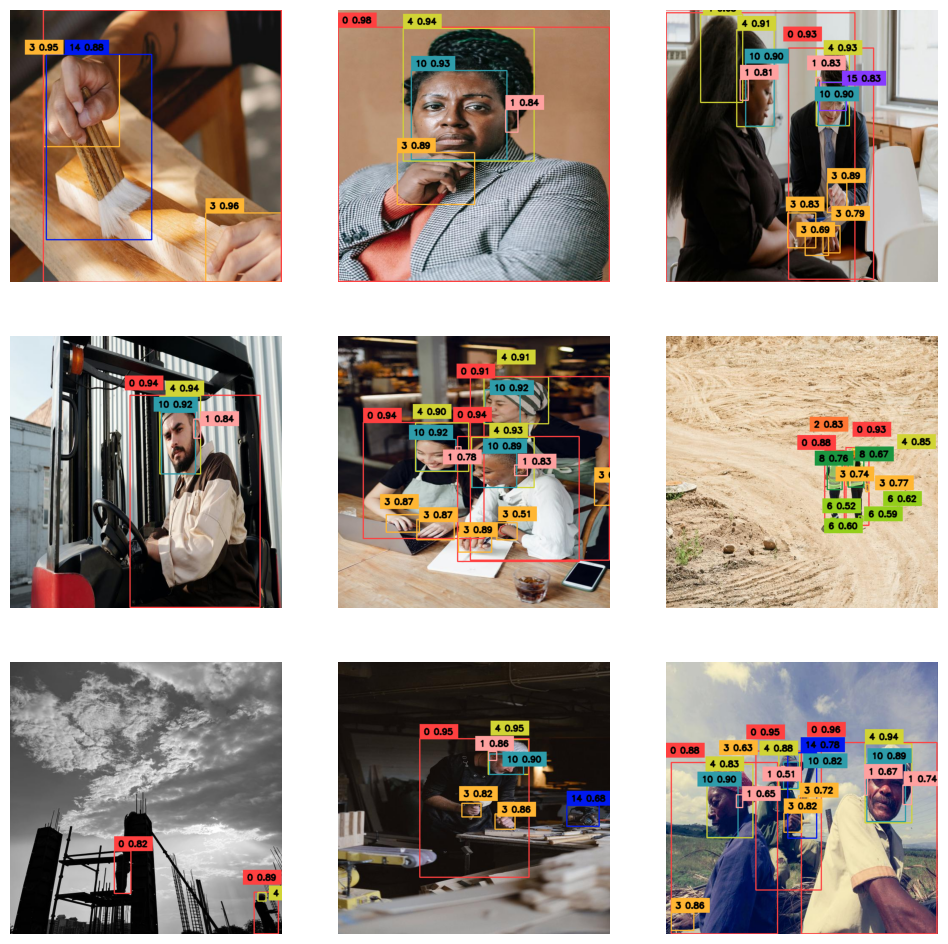

In [22]:
import supervision as sv
from rfdetr import RFDETRBase
from PIL import Image

detections_images = []

for i in range(9):
    path, image, annotations = ds[i]
    image = Image.open(path)

    detections = model.predict(image, threshold=0.5)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

    bbox_annotator = sv.BoxAnnotator(thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        text_color=sv.Color.BLACK,
        text_scale=text_scale,
        text_thickness=thickness,
        smart_position=True)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(3, 3), size=(12, 12))

In [23]:
import supervision as sv
from tqdm import tqdm
from supervision.metrics import MeanAveragePrecision

targets = []
predictions = []

for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    detections = model.predict(image, threshold=0.5)

    targets.append(annotations)
    predictions.append(detections)

100%|██████████| 810/810 [00:18<00:00, 42.85it/s]


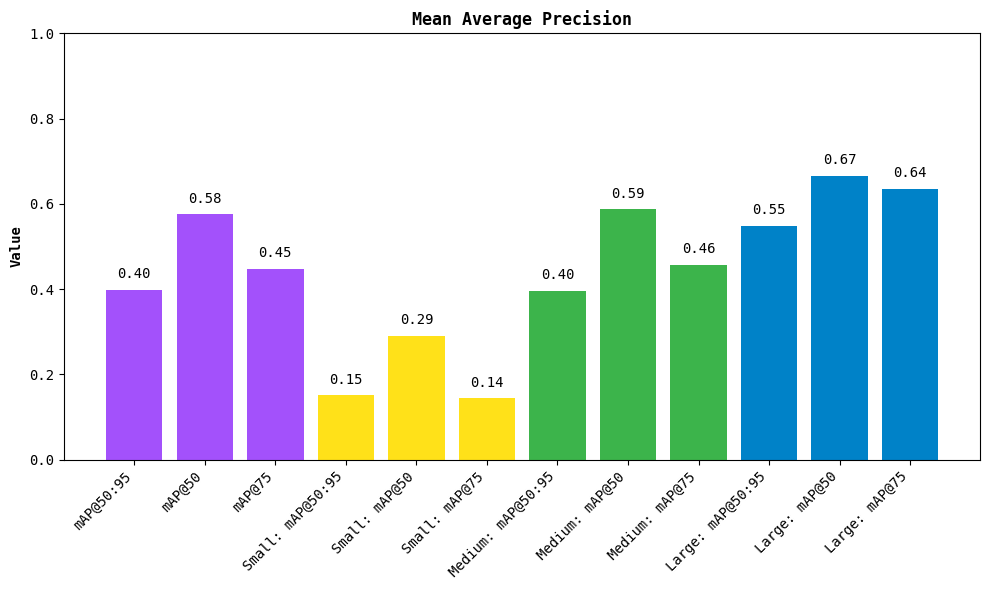

In [24]:
map_metric = MeanAveragePrecision()
map_result = map_metric.update(predictions, targets).compute()

map_result.plot()

In [25]:
print(map_result)

MeanAveragePrecisionResult:
Metric target: MetricTarget.BOXES
Class agnostic: False
mAP @ 50:95: 0.3990
mAP @ 50:    0.5755
mAP @ 75:    0.4473
mAP scores: [0.57553374 0.56501456 0.55336213 0.5344589  0.48796526 0.44728271
 0.3585294  0.26356067 0.15786368 0.04622124]
IoU thresh: [0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9  0.95]
AP per class:
  1: [0.80600774 0.79420665 0.78360107 0.77199361 0.7477846  0.712977
 0.66936728 0.60666358 0.51459404 0.27252826]
  2: [7.25345439e-01 7.14608483e-01 6.83684205e-01 6.48801508e-01
 5.73577404e-01 4.78771701e-01 3.34164414e-01 2.07406005e-01
 5.27712331e-02 5.35188654e-04]
  3: [0.62134254 0.59643714 0.58626406 0.57819095 0.52054218 0.46985558
 0.39152741 0.2648963  0.14489731 0.03606879]
  4: [0.79078088 0.7799463  0.76591955 0.74169448 0.6945093  0.62354121
 0.52470073 0.36687287 0.16649159 0.03034921]
  5: [0.7859381  0.78583946 0.76398307 0.76216803 0.74062454 0.70488755
 0.61935122 0.48792402 0.29409255 0.08541038]
  6: [0.46534653 0.46534

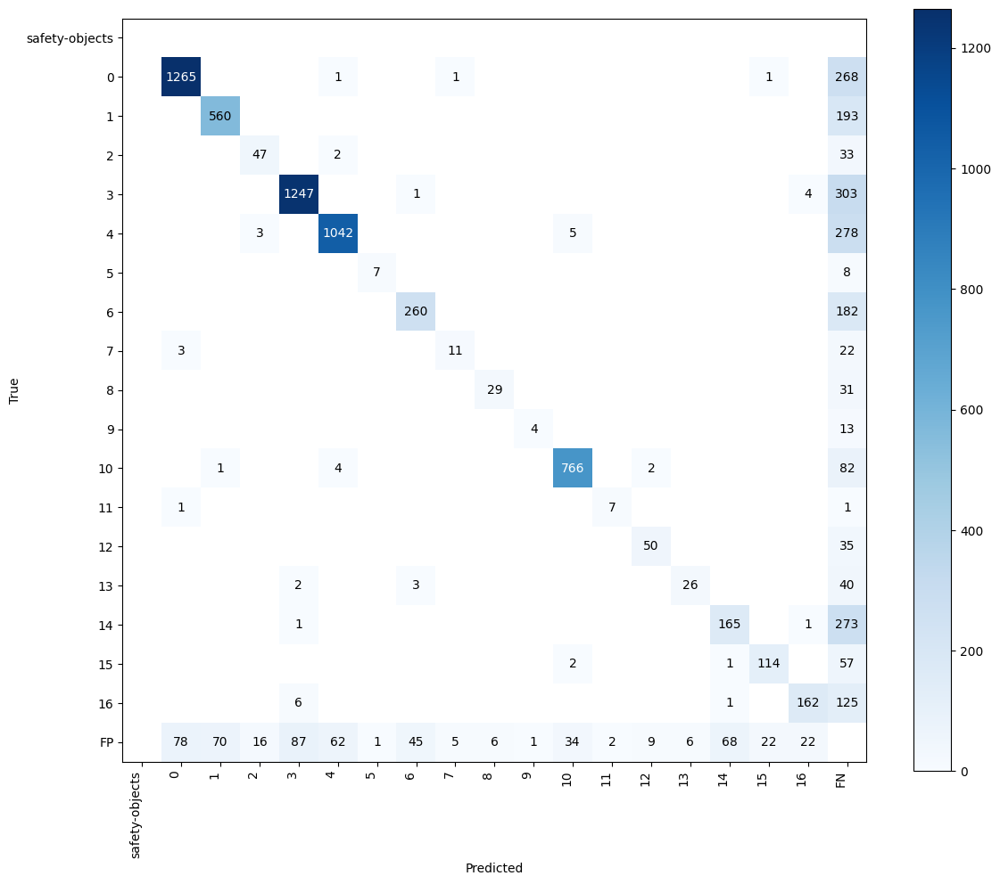

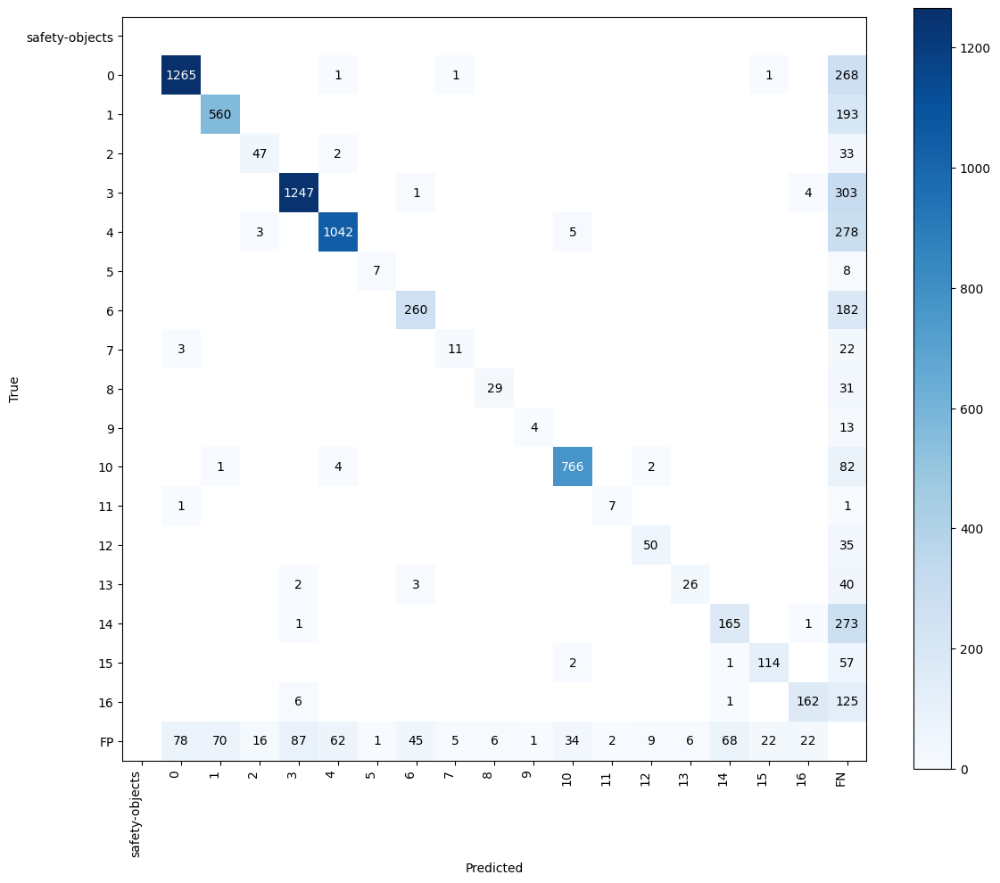

In [26]:
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds.classes
)

confusion_matrix.plot()

In [27]:
import numpy as np

# confusion_matrix.matrix is an (N×N) array where
#   row i = actual class i  
#   col j = predicted class j
cm = confusion_matrix.matrix  
classes = ds.classes

# True positives are the diagonal
tp = np.diag(cm)

# False positives = sum of each predicted-column minus the TP
fp = cm.sum(axis=0) - tp

# False negatives = sum of each actual-row minus the TP
fn = cm.sum(axis=1) - tp

# Avoid division by zero
precision = tp / (tp + fp + 1e-8)
recall    = tp / (tp + fn + 1e-8)
f1        = 2 * (precision * recall) / (precision + recall + 1e-8)

print("Per-class metrics:")
for cls, p, r, f in zip(classes, precision, recall, f1):
    print(f"  {cls:10s} • P = {p:.3f},  R = {r:.3f},  F1 = {f:.3f}")

# you can also compute macro-averages if you want:
print("\nMacro-avg precision:", precision.mean().item())
print("Macro-avg recall   :", recall.mean().item())
print("Macro-avg F1       :", f1.mean().item())

Per-class metrics:
  safety-objects • P = 0.000,  R = 0.000,  F1 = 0.000
  0          • P = 0.939,  R = 0.824,  F1 = 0.878
  1          • P = 0.887,  R = 0.744,  F1 = 0.809
  2          • P = 0.712,  R = 0.573,  F1 = 0.635
  3          • P = 0.929,  R = 0.802,  F1 = 0.861
  4          • P = 0.938,  R = 0.785,  F1 = 0.854
  5          • P = 0.875,  R = 0.467,  F1 = 0.609
  6          • P = 0.841,  R = 0.588,  F1 = 0.692
  7          • P = 0.647,  R = 0.306,  F1 = 0.415
  8          • P = 0.829,  R = 0.483,  F1 = 0.611
  9          • P = 0.800,  R = 0.235,  F1 = 0.364
  10         • P = 0.949,  R = 0.896,  F1 = 0.922
  11         • P = 0.778,  R = 0.778,  F1 = 0.778
  12         • P = 0.820,  R = 0.588,  F1 = 0.685
  13         • P = 0.812,  R = 0.366,  F1 = 0.505
  14         • P = 0.702,  R = 0.375,  F1 = 0.489
  15         • P = 0.832,  R = 0.655,  F1 = 0.733
  16         • P = 0.857,  R = 0.551,  F1 = 0.671

Macro-avg precision: 0.7446170195124799
Macro-avg recall   : 0.5271259278427